In [1]:
import cv2 as cv
import os
import random

import torch
import torch.nn as nn
import torchvision
import torchvision.transforms.v2 as transforms

from torchvision.io import decode_image

from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

In [2]:
print("GPU is available: ", torch.cuda.is_available())

GPU is available:  True


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
dataset_train = torchvision.datasets.VOCDetection(
    root="VOC", year="2007", image_set="train", download=False
)

In [5]:
def filter_color_imgfiles_min_size(folder, minsize):
    def fits(fpath):
        img = cv.imread(fpath)
        s = img.shape
        return len(s)==3 and s[0]>=minsize and s[1]>=minsize
    file_paths = [os.path.join(folder, fname) for fname in os.listdir(folder)]
    return list(filter(fits, file_paths))        

In [6]:
images_dir = 'VOC/VOCdevkit/VOC2007/JPEGImages'

In [7]:
min_resolution = 256

In [8]:
images_all = os.listdir(images_dir)
images_ok = filter_color_imgfiles_min_size(images_dir, min_resolution)
print(f' images count {len(images_all)}, images with ok (>={min_resolution}) resolution {len(images_ok)}')

 images count 5011, images with ok (>=256) resolution 4923


In [9]:
transform = transforms.Compose(
    [
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomCrop(size=(256, 256))
    ]
)

In [10]:
random.seed(42)
torch.manual_seed(42)
imgs_to_split = images_ok.copy()
random.shuffle(imgs_to_split)

In [11]:
train_ratio = 0.5
train_count = round(len(imgs_to_split) * train_ratio)
train_imgs = imgs_to_split[:train_count]
val_imgs = imgs_to_split[train_count:]

In [12]:
def channel_last(img):
    return torch.moveaxis(img, 0, -1)

def channel_first(img):
    return torch.moveaxis(img, -1, 0)

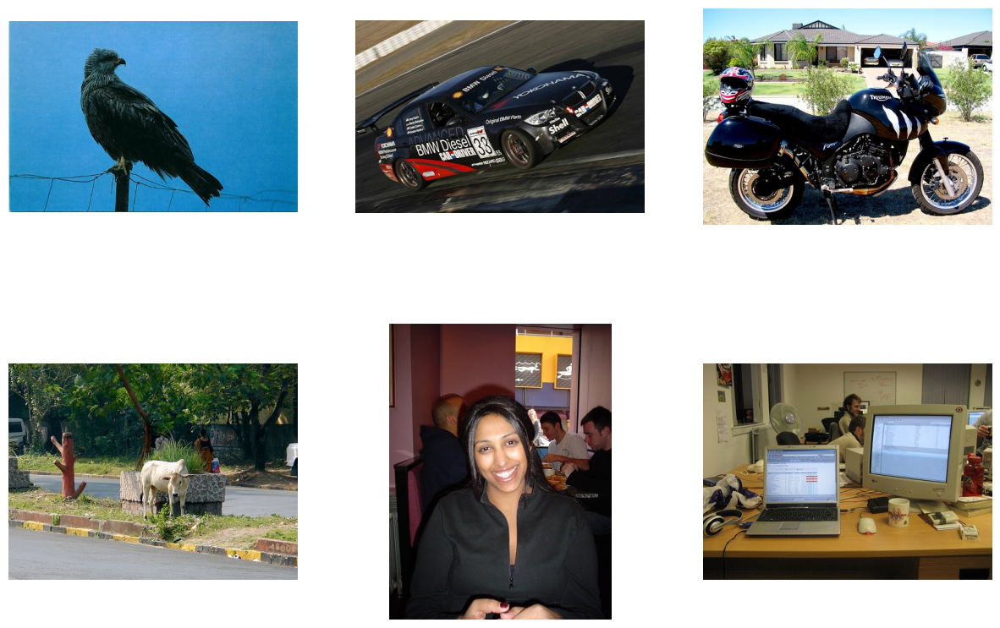

In [13]:
show_count = 3
for n in range(show_count):
    for row, imageset in enumerate([train_imgs, val_imgs]):
        filename = imageset[random.randint(0, len(imageset))]
        img = decode_image(filename)
        plt.subplot(2, show_count, row * show_count + n + 1)
        plt.imshow(channel_last(img))
        plt.axis(False)
plt.show()

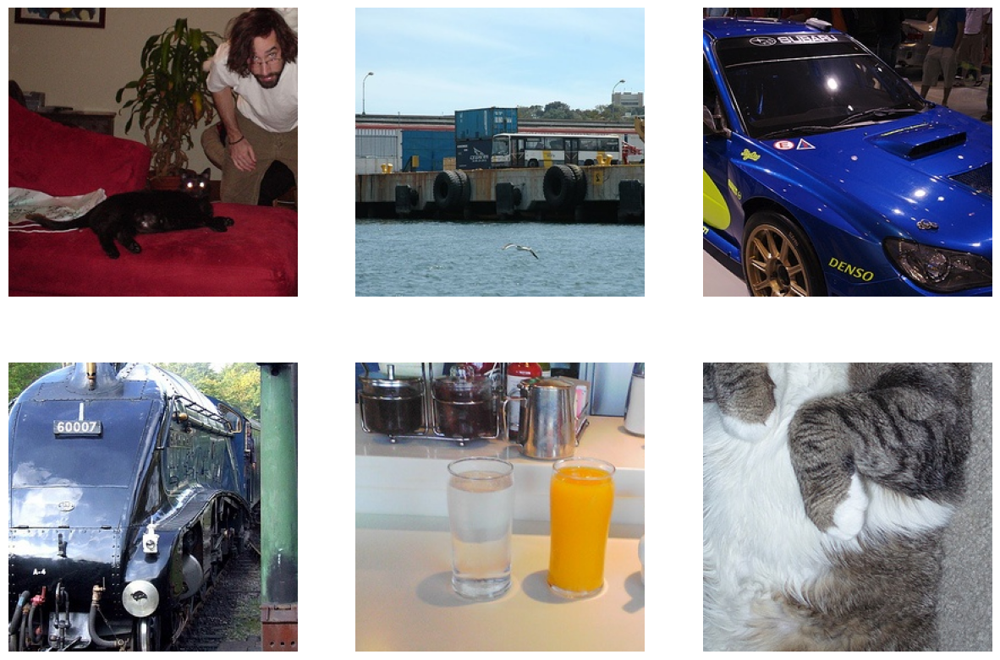

In [14]:
show_count = 3
for n in range(show_count):
    for row, imageset in enumerate([train_imgs, val_imgs]):
        filename = imageset[random.randint(0, len(imageset))]
        img = transform(decode_image(filename))
        plt.subplot(2, show_count, row * show_count + n + 1)
        plt.imshow(channel_last(img))
        plt.axis(False)
plt.show()

In [15]:
def distort_gaussian(img, factor=0.1):
    img_noise = factor * torch.randn(*img.shape)
    distorted = img + img_noise
    return torch.clamp(distorted, 0., 1.)

In [16]:
class NoiseImgDataset(torch.utils.data.Dataset):
    """Dataset loads images, crops specified patch size, adds distortion.
    distorted image is returned as x, ground truth is either original image 
    or noise (depending on noise_as_groundtruth init parameter).
    """
    def __init__(self, filelist, out_img_size=256, distort_factor=0.1, noise_as_groundtruth=False):
        self._filelist = filelist.copy()
        self._transform = transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomCrop(size=(out_img_size, out_img_size))
        ])
        self._distort_factor = distort_factor
        self._noise_as_groundtruth = noise_as_groundtruth

    def __getitem__(self, index):
        img = decode_image(self._filelist[index])
        img_transformed = self._transform(img)
        img_float = img_transformed.float()/255
        img_distorted = distort_gaussian(img_float, factor=self._distort_factor)
        if self._noise_as_groundtruth:
            return img_distorted, img_distorted-img_float            
        return img_distorted, img_float

    def __len__(self):
        return len(self._filelist)

In [17]:
batch_size = 32

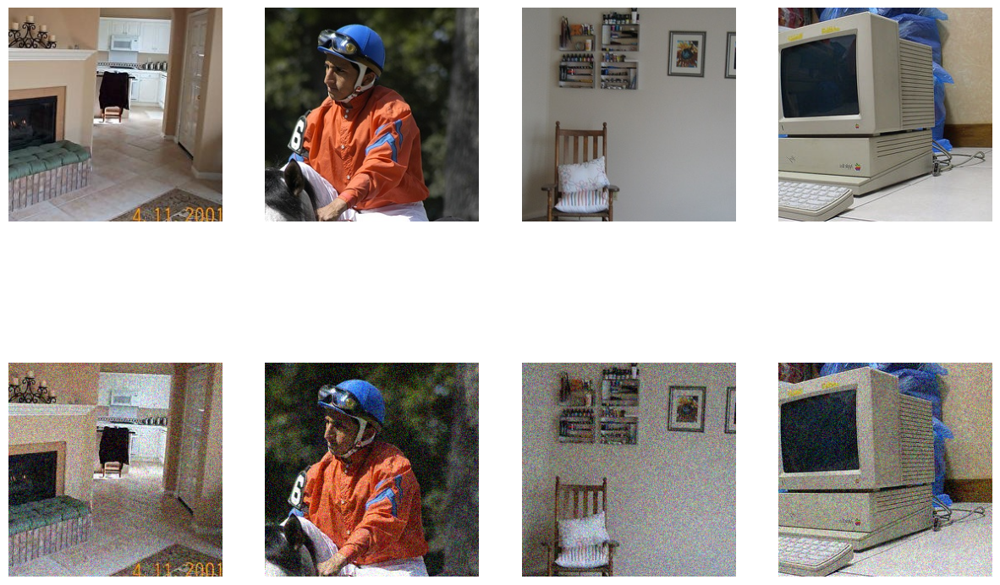

In [18]:
train_batch_generator = torch.utils.data.DataLoader(
    NoiseImgDataset(train_imgs, distort_factor=0.1), batch_size=batch_size, num_workers=2, shuffle=True
)
train_images, gt_images = next(iter(train_batch_generator))
show_count = 4
for n in range(show_count):
    for row, imageset in enumerate([gt_images, train_images]):
        plt.subplot(2, show_count, row * show_count + n + 1)
        plt.imshow(channel_last(imageset[n]))
        plt.axis(False)
plt.show()

In [19]:
class DenoiseNetBasic(nn.Module):
    def __init__(self):
        super().__init__()        
        self.encoder = nn.Sequential(
                nn.Conv2d(3, 32, (3,3), padding=1, stride=2),
                nn.ReLU(),            
                nn.Conv2d(32, 16, (3,3), padding=1, stride=2),
                nn.ReLU()
            )
        self.decoder = nn.Sequential(
                nn.ConvTranspose2d(16, 16, kernel_size=3,stride=2, padding=1, output_padding=1),
                nn.ReLU(),
                nn.ConvTranspose2d(16, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.ReLU(),
                nn.Conv2d(32, 3, (3,3), padding=1),
                nn.Sigmoid()
            )
        self.loss = nn.MSELoss()

    def forward(self, x, gt=None):
        out = self.encoder(x)
        pred = self.decoder(out)
        if gt is None:
            return pred
        loss =  self.loss(pred, gt)
        return loss

    def predict(self, x):        
        return self.forward(x)

In [20]:
lr = 1e-3

In [21]:
def check_loss(model, imgs, n, distort_factor=0.1, noise_as_groundtruth=False):
    if n:
        imgs = imgs.copy()
        random.shuffle(imgs)
        imgs = imgs[:n]
    model.eval()  # set model to evaluation mode
    loss = 0.
    samples = 0
    batch_generator = torch.utils.data.DataLoader(
        NoiseImgDataset(imgs, 
                        distort_factor=distort_factor,
                        noise_as_groundtruth=noise_as_groundtruth), 
        batch_size=32, num_workers=4, shuffle=False
    )    
    with torch.no_grad():
        for x, y in batch_generator:
            x = x.to(device=device)
            y = y.to(device=device)
            batch_loss = model(x,y)
            batch_size = x.size(0)
            loss += batch_loss.item() * batch_size
            samples += batch_size
        loss = loss / samples
    return loss

def train(model, num_epochs, optimizer_class, batch_size, 
          train_imgs=train_imgs, val_imgs=val_imgs,
          lr=1e-2, distort_factor=0.1, print_every=None,
          noise_as_groundtruth=False, scheduler_params=None
         ):
    dataset = NoiseImgDataset(train_imgs, distort_factor=distort_factor,
                              noise_as_groundtruth=noise_as_groundtruth)
    optimizer = optimizer_class(model.parameters(), lr=lr)
    train_loss = []
    val_loss = []
    num_batches = (len(train_imgs)+1)//batch_size
    model = model.to(device)
    model.train()
    scheduler = None
    if scheduler_params:
        scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, 
                                                        milestones=scheduler_params["milestones"],
                                                        gamma=scheduler_params["gamma"]) 
    for epoch in range(num_epochs):
        batch_generator = torch.utils.data.DataLoader(
            dataset, 
            batch_size=batch_size, num_workers=4, shuffle=True
        )        
        for i, (input_data, gt_data) in enumerate(batch_generator):
            model.train()            
            input_data = input_data.to(device).contiguous()
            gt_data = gt_data.to(device)
            gt_data.requires_grad = False
            loss = model(input_data, gt=gt_data)
            optimizer.zero_grad()  
            loss.backward()    
            optimizer.step()
            loss_value = loss.item()
            if print_every and (i+1)%print_every==0:
                print(f"Epoch {epoch+1}, batch {i+1}/{num_batches} , loss={loss_value}, lr={scheduler.get_last_lr()}")
        curr_train_loss = check_loss(model, train_imgs, n=250, 
                                     distort_factor=distort_factor,
                                     noise_as_groundtruth=noise_as_groundtruth)
        curr_val_loss = check_loss(model, val_imgs, n=250,
                                   distort_factor=distort_factor,
                                   noise_as_groundtruth=noise_as_groundtruth)
        train_loss.append(curr_train_loss)
        val_loss.append(curr_train_loss)
        print(f"Epoch {epoch+1}, loss={curr_train_loss}, val_loss={curr_val_loss}, lr={scheduler.get_last_lr()}")
        scheduler.step()
    return { 'loss': train_loss, 'val_loss': val_loss }

In [22]:
model = DenoiseNetBasic()

In [393]:
history = train(model, num_epochs=25, optimizer_class=torch.optim.Adam, batch_size=batch_size,
                train_imgs=train_imgs, val_imgs=val_imgs, lr=lr, distort_factor=0.1, print_every=25)

Epoch 1, batch 25/76 , loss=0.05997851490974426
Epoch 1, batch 50/76 , loss=0.01487864088267088
Epoch 1, batch 75/76 , loss=0.012903398834168911
Epoch 1, loss=0.01368954686820507, val_loss=0.0135347421169281
Epoch 2, batch 25/76 , loss=0.01390653382986784
Epoch 2, batch 50/76 , loss=0.011329177767038345
Epoch 2, batch 75/76 , loss=0.011293573305010796
Epoch 2, loss=0.01157873474061489, val_loss=0.012207092128694058
Epoch 3, batch 25/76 , loss=0.00916443020105362
Epoch 3, batch 50/76 , loss=0.009438592940568924
Epoch 3, batch 75/76 , loss=0.0125561049208045
Epoch 3, loss=0.011507228381931783, val_loss=0.011104569755494594
Epoch 4, batch 25/76 , loss=0.010887245647609234
Epoch 4, batch 50/76 , loss=0.009343101643025875
Epoch 4, batch 75/76 , loss=0.012365344911813736
Epoch 4, loss=0.010399284832179546, val_loss=0.011012473322451114
Epoch 5, batch 25/76 , loss=0.008682856336236
Epoch 5, batch 50/76 , loss=0.007720037363469601
Epoch 5, batch 75/76 , loss=0.008426972664892673
Epoch 5, loss=

In [394]:
model.eval()

DenoiseNetBasic(
  (encoder): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (1): ReLU()
    (2): ConvTranspose2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(32, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): Sigmoid()
  )
  (loss): MSELoss()
)

In [39]:
def gaussian_blur_channel_first(img, kernelsize=3):
    img = channel_last(img).detach().cpu().numpy()
    img = torch.Tensor(cv.GaussianBlur(img, (kernelsize, kernelsize), 0))
    return channel_first(img)

def visualize_prediction(model, imgfiles, n, distort_factor=0.1, blur_kernel_size=3, show_size=None):
    def center_patch(img):
        if show_size:
            h, w = img.shape[:2]
            hoffs = (h - show_size)//2
            voffs = (w - show_size)//2
            return img[hoffs:-hoffs,voffs:-voffs,:]
        return img
    
    model.eval()
    batch_generator = torch.utils.data.DataLoader(
        NoiseImgDataset(imgfiles, distort_factor=0.1), batch_size=n, num_workers=2, shuffle=True
    )
    images, gt_images = next(iter(batch_generator))
    predict_images = model.predict(images.to(device).contiguous()).detach().cpu()
    blurred = [gaussian_blur_channel_first(img, blur_kernel_size) for img in images]
    titles = ['original', 'distorted', 'restored', f'gauss_blur_{blur_kernel_size}x{blur_kernel_size}']
    columns = len(titles)
    for pi in range(n):
        for si, imageset in enumerate([gt_images, images, predict_images, blurred]):
            plt.subplot(n, columns, pi * columns + si + 1)
            plt.title(titles[si])            
            plt.imshow(center_patch(channel_last(imageset[pi])))
            plt.axis(False)
    plt.show()    

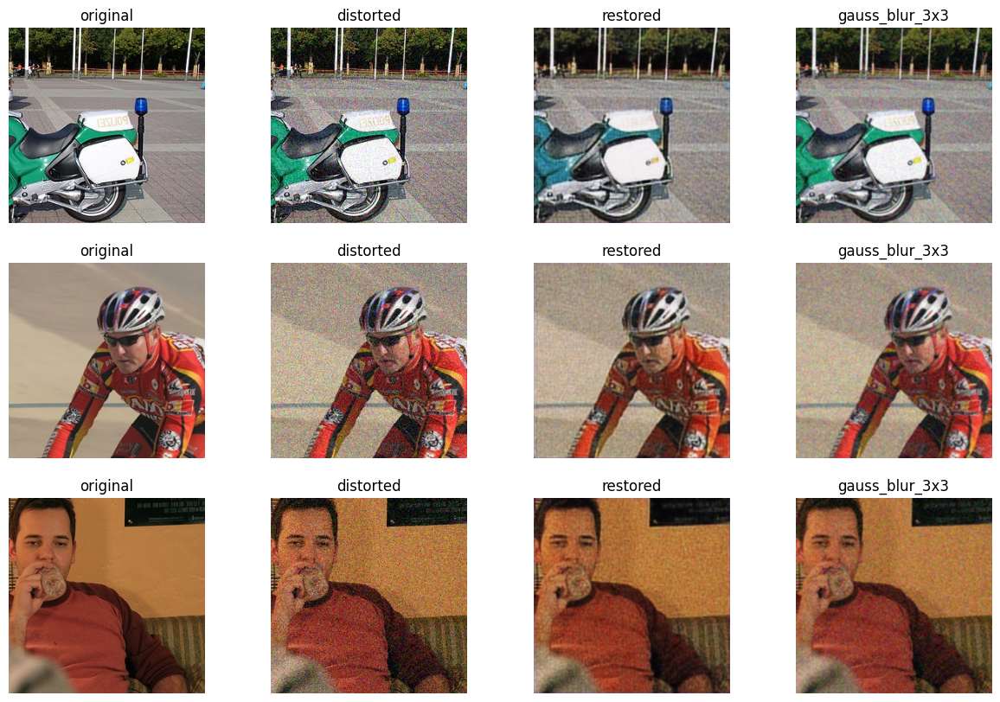

In [406]:
visualize_prediction(model, val_imgs, 3, 0.1)

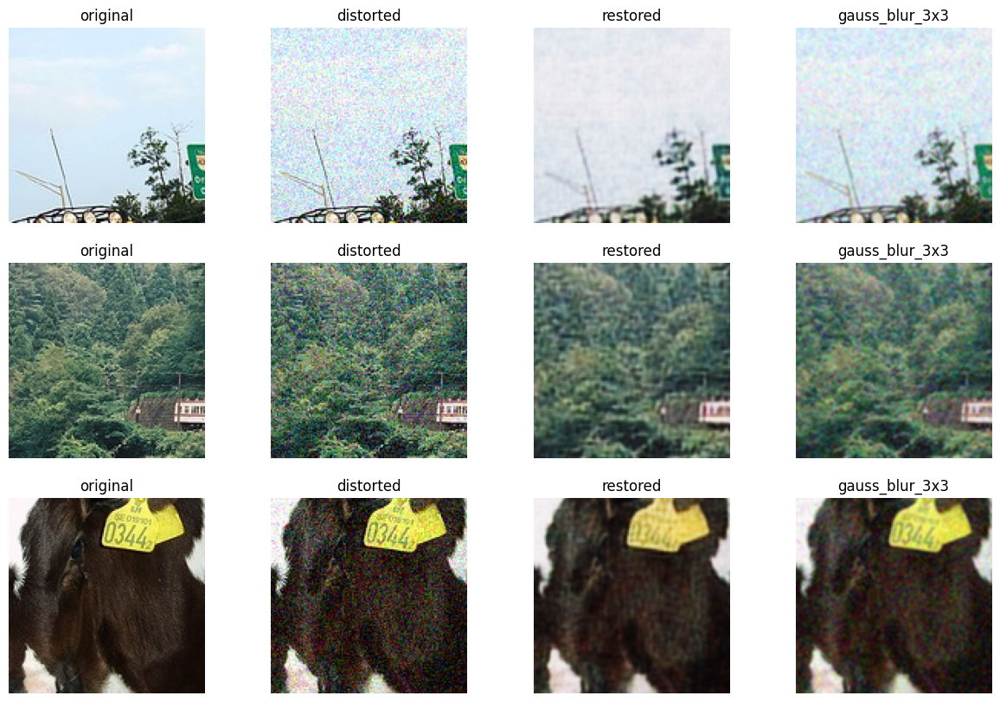

In [411]:
visualize_prediction(model, val_imgs, 3, 0.1, show_size=128)

In [412]:
torch.save(model.state_dict(), 'checkpoints/model.th')

### results are comparable with gaussian blur. but sometimes there are tone changes (for light blue, green on the sign or yellow tag).

### Let's try more channels and traditional scheme with increasing channel count when spatial dimension shrinks.

In [23]:
# increase number of channel in layers, make channel distribution 32-64-64-32 instead of 32-16-16-32 in previous network.
class DenoiseNetBasicExt(nn.Module):
    def __init__(self, alpha=1.):
        super().__init__()
        layer_channels = [32, 64]
        layer_channels = [round(c*alpha) for c in layer_channels]
        c1, c2 = layer_channels
        self.encoder = nn.Sequential(
                nn.Conv2d(3, c1, (3,3), padding=1, stride=2),
                nn.ReLU(),            
                nn.Conv2d(c1, c2, (3,3), padding=1, stride=2),
                nn.ReLU()
            )
        self.decoder = nn.Sequential(
                nn.ConvTranspose2d(c2, c2, kernel_size=3,stride=2, padding=1, output_padding=1),
                nn.ReLU(),
                nn.ConvTranspose2d(c2, c1, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.ReLU(),
                nn.Conv2d(c1, 3, (3,3), padding=1),
                nn.Sigmoid()
            )
        self.loss = nn.MSELoss()

    def forward(self, x, gt=None):
        out = self.encoder(x)
        pred = self.decoder(out)
        if gt is None:
            return pred
        loss =  self.loss(pred, gt)
        return loss

    def predict(self, x):        
        return self.forward(x)

In [414]:
modelext = DenoiseNetBasicExt()
history_ext = train(modelext, 50, torch.optim.Adam, 32, train_imgs,
                lr=1e-3, distort_factor=0.1)

Epoch 1, loss=0.012594856835901736, val_loss=0.012497944891452789
Epoch 2, loss=0.007562574688345194, val_loss=0.007266821298748255
Epoch 3, loss=0.0072137960679829125, val_loss=0.0073517772443592545
Epoch 4, loss=0.006773410782217979, val_loss=0.006607979342341423
Epoch 5, loss=0.005320122320204973, val_loss=0.005661996651440859
Epoch 6, loss=0.005118639476597309, val_loss=0.005166137579828501
Epoch 7, loss=0.004959404122084379, val_loss=0.00500416250154376
Epoch 8, loss=0.00446906827762723, val_loss=0.004507505934685469
Epoch 9, loss=0.004132388789206743, val_loss=0.004993299789726734
Epoch 10, loss=0.0047169321849942205, val_loss=0.00470210199803114
Epoch 11, loss=0.003928328089416027, val_loss=0.004108019482344389
Epoch 12, loss=0.0038314293324947356, val_loss=0.003781092170625925
Epoch 13, loss=0.0034335121549665926, val_loss=0.0034099056962877514
Epoch 14, loss=0.003399525946006179, val_loss=0.0032951990589499473
Epoch 15, loss=0.0029256305545568464, val_loss=0.003354938082396984

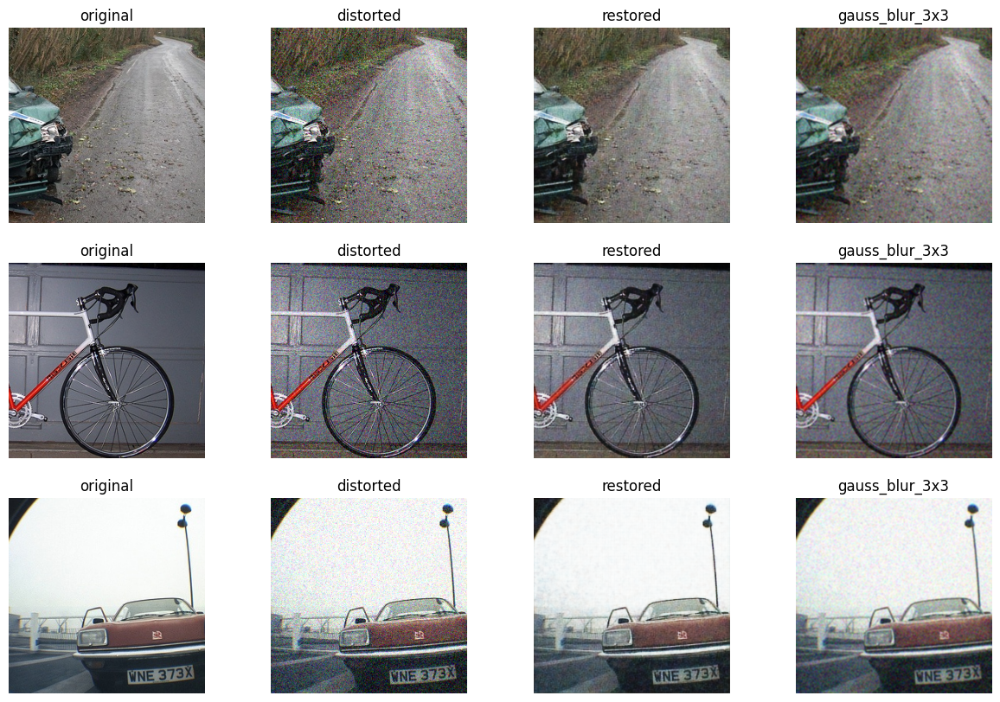

In [415]:
visualize_prediction(modelext, val_imgs, 3, 0.1, blur_kernel_size=3)

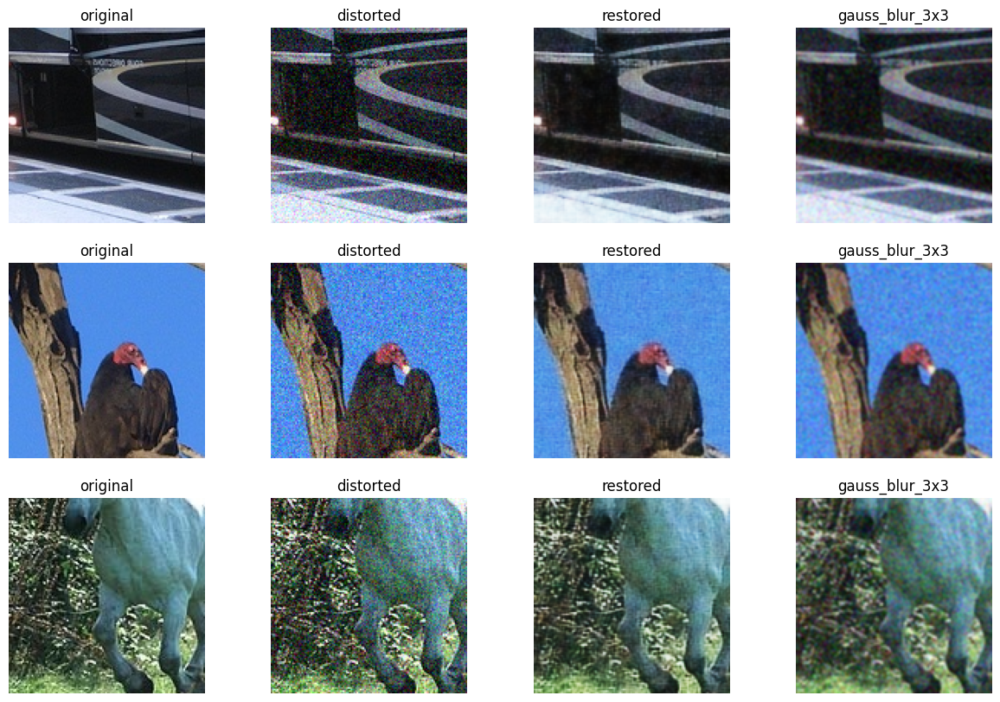

In [430]:
visualize_prediction(modelext, val_imgs, 3, 0.1, blur_kernel_size=3, show_size=128)

## The trained model shows good results. colors are preserverd, uniform areas of original image contain less artifacts.

In [431]:
torch.save(modelext.state_dict(), 'checkpoints/model_ext.th')
# you can restore the model with the line:
# model.load_state_dict(torch.load('checkpoints/model_ext.th', weights_only=True, map_location="cuda:0"))

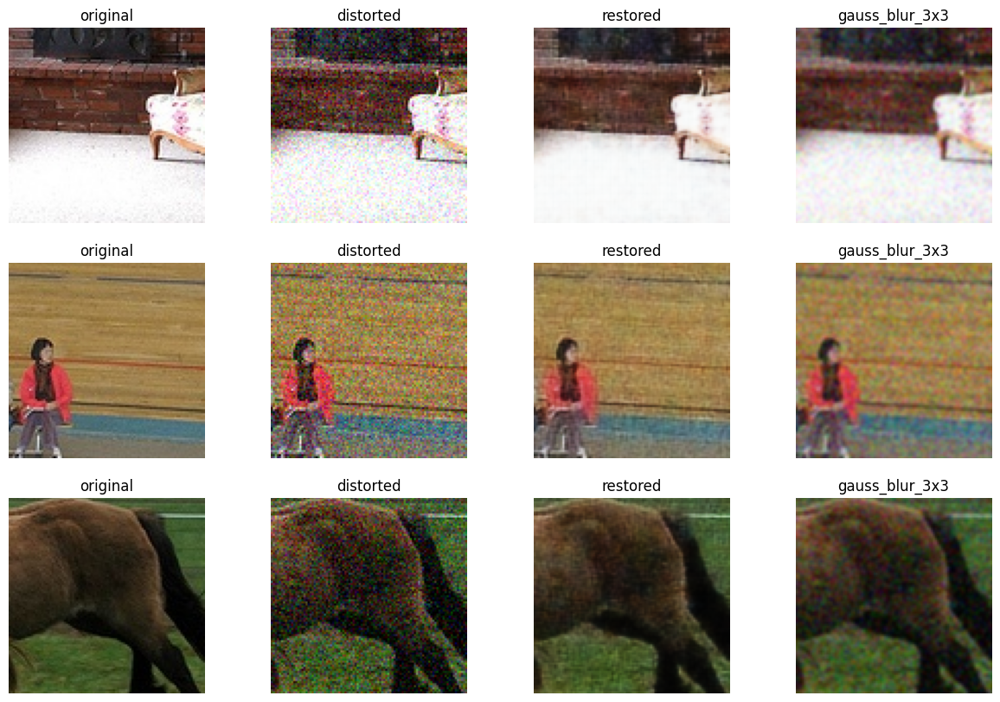

In [25]:
# check that model loading works
modelext2 = DenoiseNetBasicExt()
modelext2.load_state_dict(torch.load('checkpoints/model_ext.th', weights_only=True))
modelext2 = modelext2.to(device) 
modelext2.eval()
visualize_prediction(modelext2, val_imgs, 3, 0.1, blur_kernel_size=3, show_size=96)

In [26]:
modelext2.eval()

DenoiseNetBasicExt(
  (encoder): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (1): ReLU()
    (2): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(32, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): Sigmoid()
  )
  (loss): MSELoss()
)

Lets try DnCNN from paper 'Beyond a Gaussian Denoiser: Residual Learning of Deep CNN for Image Denoising'

The two main points:
* make network learn noise pattern from distorted image instead of learning undistorted image (this task might be easier as noise distribution is normalised and smaller)
* simple architecture more regular layers (Conv-BatchNorm-ReLU)*X without downsampling and upsampling

the repository code suggest 3x3 convolutions with 64 channels Conv2d-Relu-(Conv2d-BatchNorm-Relu)x17-Conv2d

https://github.com/cszn/DnCNN

https://www4.comp.polyu.edu.hk/~cslzhang/paper/DnCNN.pdf

In [27]:
import torch.nn.init as init

class DenoiseNetDnCNN(nn.Module):
    def __init__(self, enc_layers=2, use_sigmoid=False):
        super().__init__()
        self.channels = 64
        self.intro = nn.Sequential(
                nn.Conv2d(3, self.channels, (3,3), padding=1),
                nn.ReLU(),            
            )
        encoders = [self.regular_layer() for _ in range(enc_layers)] 
        self.encoder = nn.Sequential(*encoders)        
        self.finalize = self.finalization_layer(use_sigmoid)
        self.loss = nn.MSELoss()

    def regular_layer(self):
        return nn.Sequential(
                    nn.Conv2d(self.channels, self.channels, (3,3), padding=1, bias=False),
                    nn.BatchNorm2d(self.channels),
                    nn.ReLU(),            
                 )
        
    def finalization_layer(self, use_sigmoid):
        layers = [nn.Conv2d(self.channels, 3, (3,3), padding=1)]
        if use_sigmoid:
            layers.append(nn.Sigmoid())
        return nn.Sequential(*layers)

    def forward(self, x, gt=None):
        out = self.intro(x)
        out = self.encoder(out)
        pred = self.finalize(out)
        if gt is None:
            return pred
        loss =  self.loss(pred, gt)
        return loss

    def predict(self, x):        
        error = self.forward(x)
        return torch.clamp(x - error, 0., 1.)

    def _initialize_weights(self):
    # from https://github.com/cszn/DnCNN/blob/master/TrainingCodes/dncnn_pytorch/main_train.py        
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.orthogonal_(m.weight)
                #print('init weight')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)

In [24]:
modeldncnn = DenoiseNetDnCNN(5)

In [25]:
scheduler_params = { 'milestones': [10, 20, 30, 40], 'gamma': 0.25}
history_dncnn = train(modeldncnn, 40, torch.optim.Adam, 32, train_imgs,
                      lr=1e-3, distort_factor=0.1, noise_as_groundtruth=True,
                      print_every=25, scheduler_params=scheduler_params)

Epoch 1, batch 25/76 , loss=0.01146738138049841, lr=[0.001]
Epoch 1, batch 50/76 , loss=0.008891877718269825, lr=[0.001]
Epoch 1, batch 75/76 , loss=0.008704572916030884, lr=[0.001]
Epoch 1, loss=0.008839971251785756, val_loss=0.008891169473528863, lr=[0.001]
Epoch 2, batch 25/76 , loss=0.008661730214953423, lr=[0.001]
Epoch 2, batch 50/76 , loss=0.007364407181739807, lr=[0.001]
Epoch 2, batch 75/76 , loss=0.005567159038037062, lr=[0.001]
Epoch 2, loss=0.005201705023646355, val_loss=0.005217895716428757, lr=[0.001]
Epoch 3, batch 25/76 , loss=0.0041120960377156734, lr=[0.001]
Epoch 3, batch 50/76 , loss=0.0030695367604494095, lr=[0.001]
Epoch 3, batch 75/76 , loss=0.002753614913672209, lr=[0.001]
Epoch 3, loss=0.0028830884713679553, val_loss=0.002914328591898084, lr=[0.001]
Epoch 4, batch 25/76 , loss=0.0024266785476356745, lr=[0.001]
Epoch 4, batch 50/76 , loss=0.002215500921010971, lr=[0.001]
Epoch 4, batch 75/76 , loss=0.002259325236082077, lr=[0.001]
Epoch 4, loss=0.002187139283865

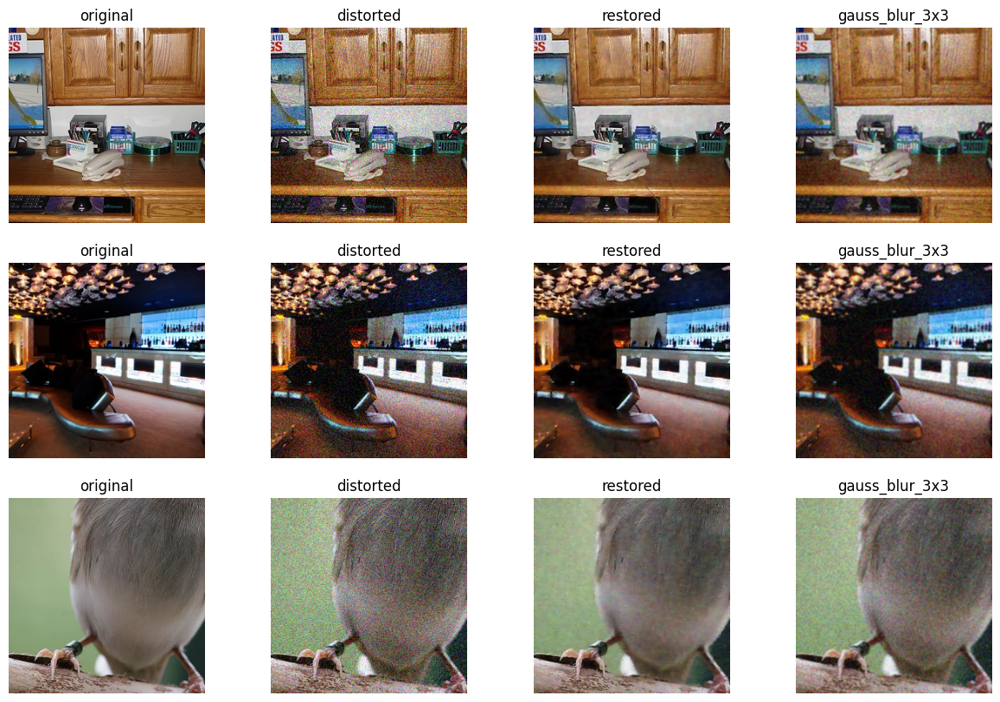

In [31]:
visualize_prediction(modeldncnn, val_imgs, 3, 0.1, blur_kernel_size=3)

In [32]:
torch.save(modeldncnn.state_dict(), 'checkpoints/model_dncnn5l.th')

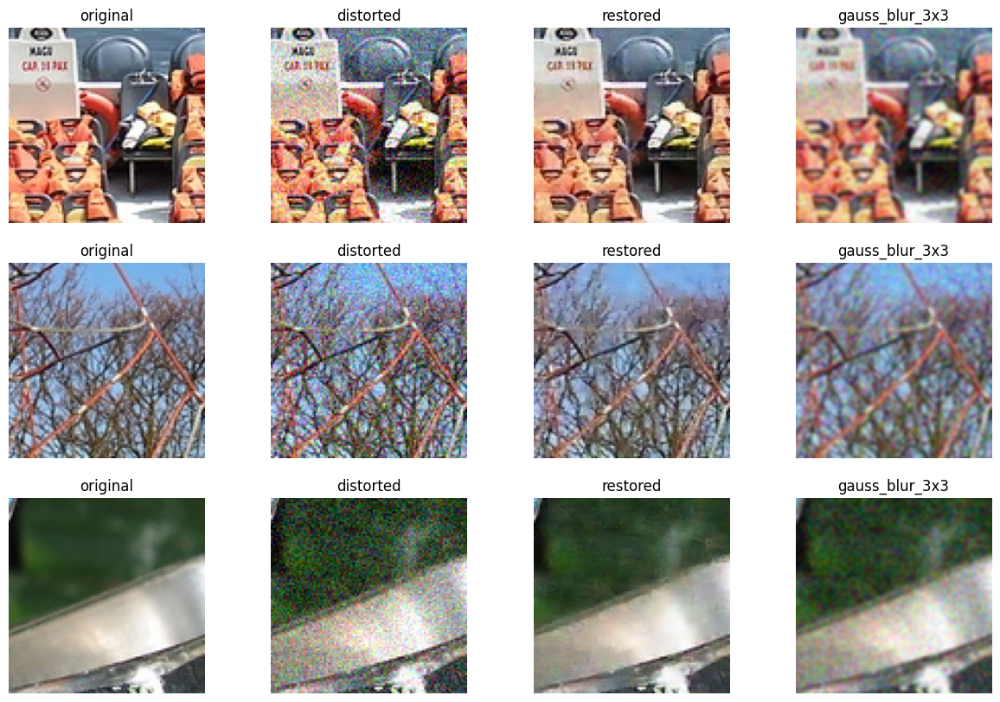

In [35]:
visualize_prediction(modeldncnn, val_imgs, 3, 0.1, blur_kernel_size=3, show_size=96)

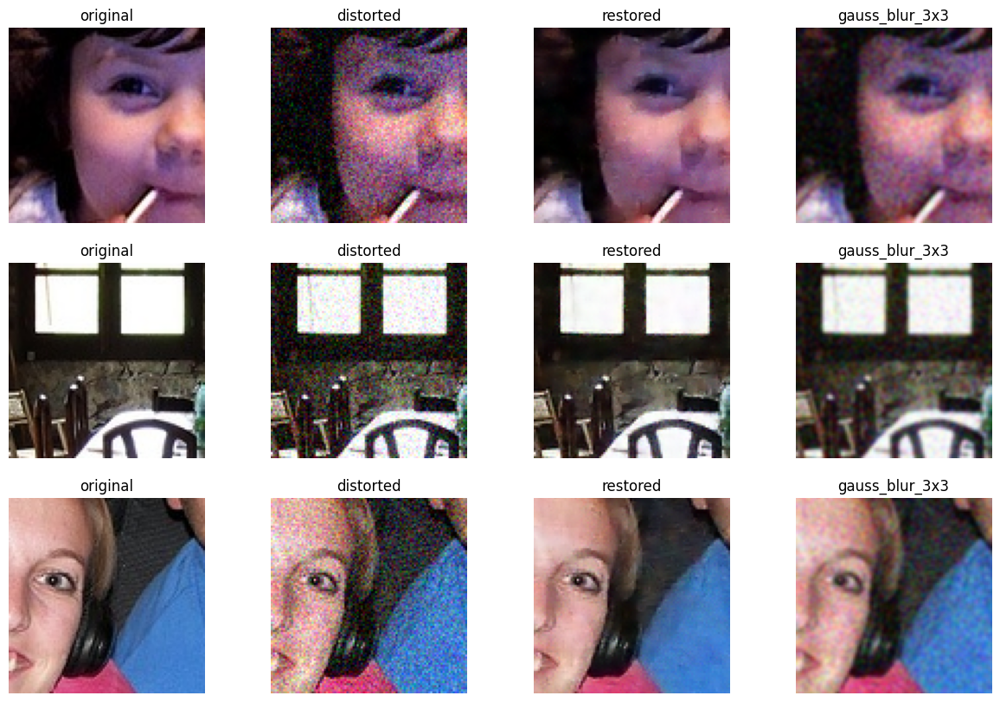

In [41]:
modeldncnn2 = DenoiseNetDnCNN(5)
modeldncnn2.load_state_dict(torch.load('checkpoints/model_dncnn5l.th', weights_only=True))
modeldncnn2 = modeldncnn2.to(device) 
modeldncnn2.eval()
visualize_prediction(modeldncnn2, val_imgs, 3, 0.1, blur_kernel_size=3, show_size=96)

In [42]:
modeldncnn2.eval()

DenoiseNetDnCNN(
  (intro): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
  )
  (encoder): Sequential(
    (0): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affi

### Let's measure noise reduction metrics

In [28]:
def floatimg_to_uint(ref):
    return torch.round(ref*255)

def psnr(ref, target):
    ref = floatimg_to_uint(ref)
    target = floatimg_to_uint(target)
    error = ref - target
    mse = torch.mean(torch.square(error))
    return 10 * torch.log10((255**2)/mse)

# Channel first function
def avg_error(img, img2):
    # average distance between colors in norm2 sense for color as vector(r,g,b)
    return torch.linalg.vector_norm(floatimg_to_uint(img)-floatimg_to_uint(img2), dim=0).mean()

def avg_channel_error(img, img2):
    return torch.abs(floatimg_to_uint(img)-floatimg_to_uint(img2)).mean()

In [44]:
import numpy as np

def calc_metrics(models, imgs, distort_factor=0.1):
    """Calculate psnr and average error between original image and
    distorted, blurred distorted, and restored (predicted) by models.
    """
    for model in models:
        model.eval()
    models = [model.to(device) for model in models]
    nmodels = len(models)
    nimgs = len(imgs)
    psnrs = np.zeros((nimgs, nmodels+2))
    avg_errors = np.zeros((nimgs, nmodels+2))
    avg_channel_errors = np.zeros((nimgs, nmodels+2))    
    loss = 0.
    samples = 0
    batch_generator = torch.utils.data.DataLoader(
        NoiseImgDataset(imgs, 
                        distort_factor=distort_factor,
                        noise_as_groundtruth=False), 
        batch_size=1, num_workers=4, shuffle=False
    )
    with torch.no_grad():
        for ni, (x, y) in enumerate(batch_generator):
            x = x.to(device=device)
            y = y.to(device=device)
            psnrs[ni, 0] = psnr(y[0], x[0]).item()
            avg_errors[ni, 0] = avg_error(y[0], x[0]).item()
            avg_channel_errors[ni, 0] = avg_channel_error(y[0], x[0]).item()
            blurred = gaussian_blur_channel_first(x[0]).to(device)
            psnrs[ni, 1] = psnr(y[0], blurred).item()
            avg_errors[ni, 1] = avg_error(y[0], blurred).item()
            avg_channel_errors[ni, 1] = avg_channel_error(y[0], blurred).item()            
            for nm, model in enumerate(models):
                predict = model.predict(x)
                psnrs[ni, nm + 2] = psnr(y[0], predict[0]).item()
                avg_errors[ni, nm + 2] = avg_error(y[0], predict[0]).item()               
                avg_channel_errors[ni, nm + 2] = avg_channel_error(y[0], predict[0]).item()                   
    return { 
        "psnrs": psnrs,
        "avg_errors": avg_errors,
        "avg_channel_errors": avg_channel_errors
    }

In [45]:
model_c = DenoiseNetBasic()
model_c.load_state_dict(torch.load('checkpoints/model.th', weights_only=True))

modelext_c = DenoiseNetBasicExt()
modelext_c.load_state_dict(torch.load('checkpoints/model_ext.th', weights_only=True))

modeldncnn_c = DenoiseNetDnCNN(5)
modeldncnn_c.load_state_dict(torch.load('checkpoints/model_dncnn5l.th', weights_only=True))

<All keys matched successfully>

In [46]:
metrics = calc_metrics([model_c, modelext_c, modeldncnn_c], val_imgs)

In [47]:
psnrs = metrics["psnrs"]
avg_errors = metrics["avg_errors"]
avg_channel_errors = metrics["avg_errors"]

In [48]:
psnrs[:5]

array([[20.55109406, 22.87190437, 22.497118  , 26.26749229, 28.44019318],
       [20.30179977, 27.24900436, 27.00143433, 28.46641922, 29.84355927],
       [20.58844566, 28.33217239, 30.55739212, 31.0825119 , 33.45349121],
       [20.34259033, 26.11015701, 26.06165886, 28.13642502, 29.60170937],
       [20.12280655, 25.63267517, 25.59367943, 27.3115921 , 28.29766273]])

In [49]:
avg_channel_errors[:5]

array([[37.79776001, 24.24779701, 23.30858612, 16.42026138, 13.54489231],
       [39.22016525, 17.11776733, 16.23322105, 14.03123093, 11.89431   ],
       [38.09926605, 15.05752754, 10.64525795, 10.54115677,  7.77399349],
       [39.1490593 , 18.39210701, 17.10926056, 14.1570425 , 11.90807915],
       [40.13765335, 19.67774963, 18.86285782, 15.66663742, 14.34578323]])

In [50]:
avg_psnr = psnrs.mean(axis = 0)
mean_error = avg_channel_errors.mean(axis = 0)

In [64]:
import pandas as pd
combined_metrics = np.array([avg_psnr, mean_error]).transpose()
data = { name: values for name, values in zip(names, combined_metrics) }
metric_df = pd.DataFrame(data={ 'metric': ['PSNR', 'Avg error'], **data} )
metric_df

,metric,distorted,blurred,NN 32-16-16-32,NN 32-64-64-32,DnCNN 5L
0,PSNR,20.486834,24.941336,24.751778,27.049266,28.788498
1,Avg error,38.225143,21.203125,20.544572,16.126832,13.472233


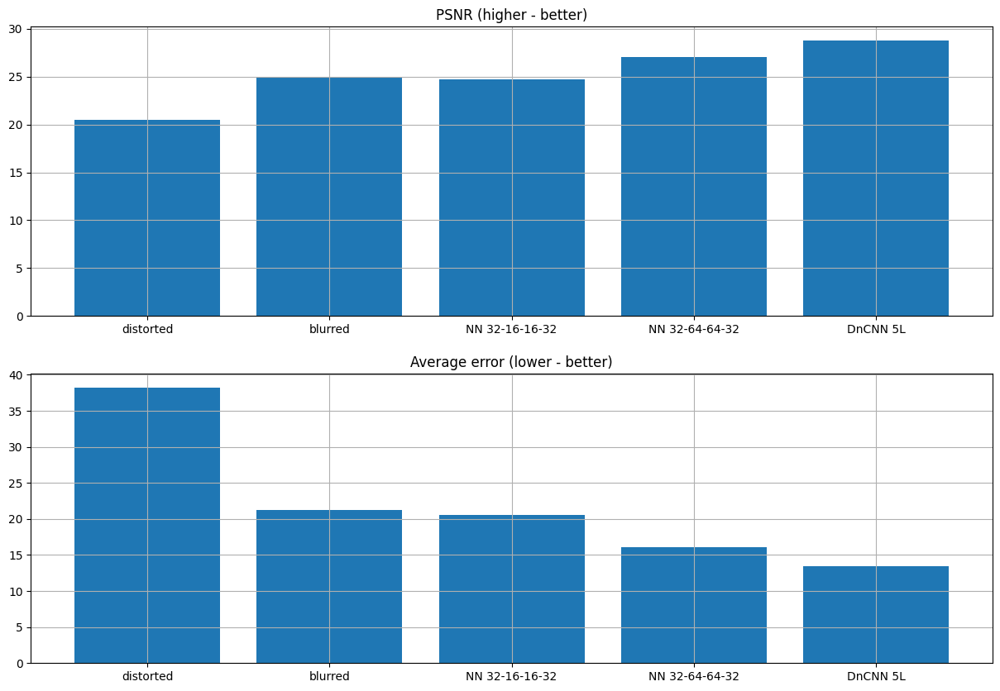

In [65]:
names = ['distorted', 'blurred', 'NN 32-16-16-32', 'NN 32-64-64-32', 'DnCNN 5L']
plt.subplot(2,1,1)
plt.title('PSNR (higher - better)')
plt.bar(x=names, height=avg_psnr),
plt.grid(True)
plt.subplot(2,1,2)
plt.title('Average error (lower - better)')
plt.bar(x=names, height=mean_error),
plt.grid(True)
plt.show()